In [ ]:

! pip install datasets
! pip install transformers datasets soundfile speechbrain accelerate

  Cloning https://github.com/NimaYaqmuri/transformers.git (to revision fix/speecht5-bug) to /tmp/pip-req-build-q_8u0zqc
  Running command git clone --filter=blob:none --quiet https://github.com/NimaYaqmuri/transformers.git /tmp/pip-req-build-q_8u0zqc
  Running command git checkout -q fix/speecht5-bug
  error: pathspec 'fix/speecht5-bug' did not match any file(s) known to git
  error: subprocess-exited-with-error
  
  × git checkout -q fix/speecht5-bug did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× git checkout -q fix/speecht5-bug did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
Token will not been saved to git credential helper. Pass `add_to_git_credential=True` if you want to set the git credential as well.
Token is valid (permissio

In [ ]:
from datasets import load_dataset
from transformers import SpeechT5FeatureExtractor, SpeechT5Tokenizer
from transformers import AutoModel
from speechbrain.pretrained import EncoderClassifier
from transformers import SpeechT5ForTextToSpeech
from transformers import SpeechT5HifiGan
from transformers import SpeechT5Processor, SpeechT5ForSpeechToText
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torch
import os
from IPython.display import Audio, display
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
spk_model_name = "speechbrain/spkrec-xvect-voxceleb"
model_checkpoint= "microsoft/speecht5_tts"
vocoder_checkpoint = "microsoft/speecht5_hifigan"
feature_extractor = SpeechT5FeatureExtractor.from_pretrained(model_checkpoint)
tokenizer = SpeechT5Tokenizer.from_pretrained(model_checkpoint)
model = SpeechT5ForTextToSpeech.from_pretrained(model_checkpoint).to(device)
vocoder = SpeechT5HifiGan.from_pretrained(vocoder_checkpoint).to(device)
speaker_model = EncoderClassifier.from_hparams(source = spk_model_name, run_opts ={"device": device}, savedir = os.path.join("/tmp", spk_model_name))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/433 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/232 [00:00<?, ?B/s]

spm_char.model:   0%|          | 0.00/238k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/40.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/234 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/2.06k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/585M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/50.7M [00:00<?, ?B/s]

hyperparams.yaml:   0%|          | 0.00/2.04k [00:00<?, ?B/s]

embedding_model.ckpt:   0%|          | 0.00/16.9M [00:00<?, ?B/s]

mean_var_norm_emb.ckpt:   0%|          | 0.00/3.20k [00:00<?, ?B/s]

classifier.ckpt:   0%|          | 0.00/15.9M [00:00<?, ?B/s]

label_encoder.txt:   0%|          | 0.00/129k [00:00<?, ?B/s]

### Dataset

In [ ]:
persian_train_dataset = load_dataset("mozilla-foundation/common_voice_13_0", "fa", split="train", use_auth_token=True)
persian_test_dataset = load_dataset("mozilla-foundation/common_voice_13_0", "fa", split="test", use_auth_token=True)

/usr/local/lib/python3.10/dist-packages/datasets/load.py:2483: FutureWarning: 'use_auth_token' was deprecated in favor of 'token' in version 2.14.0 and will be removed in 3.0.0.
You can remove this warning by passing 'token=<use_auth_token>' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:1429: FutureWarning: The repository for mozilla-foundation/common_voice_13_0 contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/mozilla-foundation/common_voice_13_0
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


Generating train split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 5438it [00:00, 54375.90it/s]
Reading metadata...: 13176it [00:00, 67903.06it/s]
Reading metadata...: 28024it [00:00, 72443.99it/s]


Generating validation split: 0 examples [00:00, ? examples/s]


Reading metadata...: 10440it [00:00, 126012.71it/s]


Generating test split: 0 examples [00:00, ? examples/s]


Reading metadata...: 10440it [00:00, 114964.93it/s]


Generating other split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 20673it [00:00, 126412.48it/s]


Generating invalidated split: 0 examples [00:00, ? examples/s]


Reading metadata...: 0it [00:00, ?it/s]
Reading metadata...: 14071it [00:00, 77813.93it/s]


In [ ]:
from datasets import Audio
dataset = persian_train_dataset
dataset = dataset.cast_column("audio", Audio(sampling_rate=16000))
print(len(dataset))

28024


In [ ]:
#add persian charecter to tokenizer
persian_characters = ['ع', 'ف', 'ط', 'ر', 'ل', 'پ', '«', ' ', 'ض', 'ظ', 'ج', 'خ', 'چ', 'ؤ', 'ـ', 'د', 'ً', 'ى', 'َ', 'ٔ', 'ئ', 'ے', 'ۀ', '“', 'ة', 'غ', 'ء', 'أ', 'م', '”', 'ش', 'ق', 'ُ', 'و', 'ت', 'ه', 'ٌ', 'ِ', 'ب', '؟', 'ذ', 'ي', 'ک', 'ح', 'ص', 'ك', 'آ', '»', 'ز', '،', 'ا', 'ن', '؛', '=', '–', 'س', 'گ', 'ث', 'ی', 'ّ', 'ژ']
tokenizer.add_tokens(list(persian_characters))
model.resize_token_embeddings(len(tokenizer))

sample = dataset[2]["sentence"]
tokenized_sample = tokenizer(sample, return_attention_mask=False)['input_ids']

print(f"Sample : {sample}")
print(f'Ids: {str(tokenized_sample)}')

Sample : اشاره کرد که دنبالش بروم.
Ids: [131, 111, 131, 84, 116, 88, 123, 84, 96, 88, 123, 116, 88, 96, 132, 119, 131, 85, 111, 88, 119, 84, 114, 109, 4, 26, 2]


# Model

speaker embedding

In [ ]:
def speaker_embedding_generator(waveform):
    with torch.no_grad():
        speaker_embeddings = speaker_model.encode_batch(torch.tensor(waveform))
        speaker_embeddings = torch.nn.functional.normalize(speaker_embeddings, dim=2)
        speaker_embeddings = speaker_embeddings.squeeze()
    return speaker_embeddings

In [ ]:
dataset[0]

{'client_id': 'f07716fdbad07f44e58a9597e164df11e5d8bbe99a8f3ec384f6654d0f91aa55f0603e14b2c3c7f20f37da41784b20587a08f20cb6c434effff9904a5977e72f',
 'path': '/root/.cache/huggingface/datasets/downloads/extracted/85450b3d404f174436bdb1a6045423e59f6032eb7b4209ebcd88e5d67d4e7c54/fa_train_0/common_voice_fa_30206283.mp3',
 'audio': {'path': '/root/.cache/huggingface/datasets/downloads/extracted/85450b3d404f174436bdb1a6045423e59f6032eb7b4209ebcd88e5d67d4e7c54/fa_train_0/common_voice_fa_30206283.mp3',
  'array': array([ 1.77635684e-14, -2.48689958e-14,  6.75015599e-14, ...,
          2.67317664e-05,  3.16987680e-05,  2.79086235e-05]),
  'sampling_rate': 16000},
 'sentence': 'او خود را نزد خویشاوندان پولدار خود خوار و خفیف کرد.',
 'up_votes': 2,
 'down_votes': 0,
 'age': '',
 'gender': '',
 'accent': '',
 'locale': 'fa',
 'segment': '',
 'variant': ''}

In [ ]:
def prepare_data(row_data):
    audio = row_data["audio"]
    result = {}
    with torch.no_grad():
        input_features = feature_extractor(audio_target=audio["array"], sampling_rate=16000, return_attention_mask=False,  return_tensors="pt")
        input_features['input_values'] = input_features['input_values'][0]
        speaker_embeddings = speaker_embedding_generator(audio["array"])

        input_ids = tokenizer(text=row_data["sentence"], return_attention_mask=False,  return_tensors="pt", padding='longest').input_ids[0]
    result["input_ids"] = input_ids
    result["input_features"] = input_features
    result["speaker_embeddings"] = speaker_embeddings.squeeze()

    return result

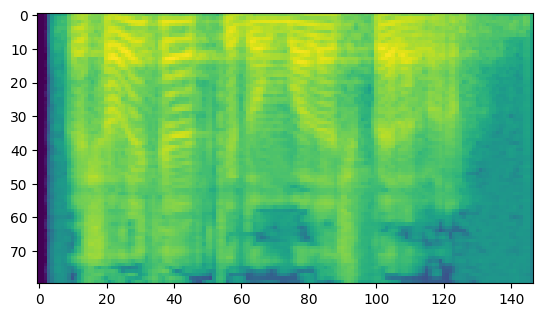

In [ ]:
plt.figure()
plt.imshow(prepare_data(dataset[2])["input_features"]['input_values'].T)
plt.show()

In [ ]:
dataset = dataset.map(prepare_data, remove_columns=dataset.column_names)

Map:   0%|          | 0/28024 [00:00<?, ? examples/s]

In [ ]:
torch.save(dataset, 'all_dataset.pt')

In [ ]:
def speech_generator(model, row_data):
    model.eval()
    speeches = []
    with torch.no_grad():
        input_ids = tokenizer(text=row_data["sentence"], return_tensors="pt", padding='longest').input_ids.to(device)
        embeddings = torch.zeros((1, 512)).to(device)
        speech = model.generate_speech(input_ids=input_ids, speaker_embeddings=embeddings, vocoder=vocoder)
        speeches.append(speech.cpu().numpy())
    return speeches

In [ ]:
from IPython.display import Audio, display
import random

num_epochs = 30
batch_size = 15
learning_rate = 1e-5
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=0.0)
losses=[]

train_data = dataset.select(range(15000))

batch_loop = tqdm(range(0, len(train_data), batch_size), total=len(train_data)//batch_size, leave=False)
scheduler = torch.optim.lr_scheduler.LinearLR(optimizer, total_iters=(len(train_data) // batch_size) * num_epochs)

for epoch in range(num_epochs):
    model.train()
    total_loss = 0

    for batch_number in batch_loop:
        inputs = train_data[batch_number:batch_number+batch_size]

        f_size = feature_extractor.feature_size
        feature_extractor.feature_size = feature_extractor.num_mel_bins
        input_features = feature_extractor.pad([{'input_values': input_feature['input_values']} for input_feature in inputs['input_features']], return_tensors='pt')
        feature_extractor.feature_size = f_size
        input_values = input_features['input_values'].masked_fill(input_features['attention_mask'].unsqueeze(-1).ne(1), -100)
        input_ids = tokenizer.pad([{'input_ids': v} for v in inputs['input_ids']], return_tensors='pt')

        if model.config.reduction_factor > 1:
            target_lengths = torch.tensor([len(feature["input_values"]) for feature in inputs['input_features']])
            target_lengths = target_lengths.new([length - length % model.config.reduction_factor for length in target_lengths])
            max_length = max(target_lengths)
            input_values = input_values[:, :max_length]

        inputs = {
            'labels': input_values.to(device),
            'input_ids': input_ids['input_ids'].to(device),
            'attention_mask': input_ids['attention_mask'].to(device),
            'speaker_embeddings': torch.tensor(inputs['speaker_embeddings']).to(device)
        }

        optimizer.zero_grad()
        outputs = model(**inputs)
        total_loss += outputs.loss
        outputs.loss.backward()
        optimizer.step()
        scheduler.step()
        batch_loop.set_postfix(loss=outputs.loss.item())
    average_loss = total_loss / (len(train_data) // batch_size)
    losses.append(average_loss.cpu().detach().numpy())

    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {average_loss}')

    for i in range(3):
      test = persian_test_dataset[random.randint(1, 10440)]
      generated_speeches = speech_generator(model, test)
      print(f"test sample{i} : {test['sentence']}")
      display(Audio(generated_speeches, rate=16000))


    torch.save(model.state_dict(), f'speech_t5{epoch}.pt')
    torch.cuda.empty_cache()

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch [1/30], Loss: 0.5855047106742859
test sample0 : به خوبی کار نمی کند.


test sample1 : نمی دونه ما عوضش کردیم


test sample2 : بذارین بره دیگه باید عادت کنه به اینکارا.


Epoch [2/30], Loss: 0.5751737356185913
test sample0 : می خوام از اینجا برم یه جای دیگه


test sample1 : به قول دوستم مهسا تو پاییز آدم همه چیز یادش میمونه


test sample2 : من فکر نمی کنم حالش به اندازه کافی گرفته باشم


Epoch [3/30], Loss: 0.5717426538467407
test sample0 : پیشرفت و توسعه ی چشمگیر بعضی از استانها


test sample1 : فقط اونجاش که دوباره نفس میگیره و زور میزنه


test sample2 : من پیش دانشگاهی بودم


Epoch [4/30], Loss: 0.5678564310073853
test sample0 : اختلاف فوتبال ایران و اروپا در یک قاب


test sample1 : زمانه دستخوش آشوب است.


test sample2 : با ازدواج در کودکی مواجه هستند با حاملگیهای زودرس و مرگ آور مواجهاند


Epoch [5/30], Loss: 0.5636525750160217
test sample0 : حرام کردن خوراک خوب گناه دارد.


test sample1 : راستش رو بخوای دلم براش سوخت


test sample2 : آدمو از تک و تنهایی بدجوری میترسونه


Epoch [6/30], Loss: 0.5593103170394897
test sample0 : این همه نعمت اما همیشه بی نصیبن


test sample1 : !تقریبا خورد تو صورتم


test sample2 : خشکاندیشی او از نوشتههایش هویدا است.


Epoch [7/30], Loss: 0.5574122071266174
test sample0 : آیا با این حرف پیکاسو موافقید که گفته است


test sample1 : .دو روز دیگه داره میره


test sample2 : چه خط هوایی پرواز می کنید؟


Epoch [8/30], Loss: 0.5507928729057312
test sample0 : پاک شدگی آشکار در دستنوشته


test sample1 : اهداف امیدوارکننده اجتماعی و اقتصادی را بطور جدی در نظامی حیاتپذیر بر روی زمین دنبال میکند


test sample2 : خودم رو مقصر میدونستم


Epoch [9/30], Loss: 0.5530619621276855
test sample0 : کسی تو مهمونی ما نمیاد


test sample1 : بنابراین در پی به حداکثر رساندن شانس رسیدن به نتیجه سودمند است


test sample2 : ایناکیلویی چند،اصل کاری خودتی


Epoch [10/30], Loss: 0.5455169081687927
test sample0 : آیا تو دوست دانیل هستی؟


test sample1 : کافی است؟ نه کاملاً


test sample2 : سرعت سنج کار نمی کند.


Epoch [11/30], Loss: 0.5445401072502136
test sample0 : ترس از ناکامی در مخیلهاش قوت میگرفت.


test sample1 : .همه شب رو منتظرت بودم


test sample2 : به قدرتمند ترین شخصیت مشهور


Epoch [12/30], Loss: 0.5424141883850098
test sample0 : ازاده لبخند به لب و خیره و متفکر از خانه بیرون می اید.


test sample1 : خورش کدو


test sample2 : محققان در جریان مطالعات آزمایشگاهی بر روی موش دریافتند


Epoch [13/30], Loss: 0.5391858816146851
test sample0 : چه موقع به بوینس آیرس می رسیم؟


test sample1 : اداره بینالمللی اوزان و مقیاسها


test sample2 : این بدان معناست که همه تاریخچه قرار ملاقات شما و یا هر چیزی که با هم مرتبط است


Epoch [14/30], Loss: 0.5382965207099915
test sample0 : امروز کلی گریه کردم چون نمیخام بابام و مامانم پیربشن


test sample1 : این پسر او است.


test sample2 : یعنی شما نمی دونی؟ ناسلامتی دست به قلمم ها. خوب نوشتنو میگم دیگه.


Epoch [15/30], Loss: 0.5388540029525757
test sample0 : من اسکواش بازی می کردم


test sample1 : بَهیره


test sample2 : ماجرا رو براش تعریف کردم اون گفت:مریم اگه میدونی پسر خوبیه خب چه اشکالی داره باهاش بیشتر اشنا بشو


Epoch [16/30], Loss: 0.5349381566047668
test sample0 : باید چیزی تو خونش باشه


test sample1 : به دلم برات شده بود که او ممکن است دزد باشد.


test sample2 : اگه دو دقیقه هم بیکار باشن کتابشونو وا میکنن و شروع به خوندن میکنن


Epoch [17/30], Loss: 0.5330561995506287
test sample0 : رآس ، از دیدنت خوشبختم


test sample1 : اینجا منتظر بمانید.


test sample2 : شکر می خوری؟


Epoch [18/30], Loss: 0.5310760140419006
test sample0 : او مدتها در جستجوی موفقیت بوده است.


test sample1 : رفیق این دوست دختر منه


test sample2 : ترافیک شدیدیم بود و دیدن نور ماشینا و چراغا و لامپهای مراکز تجاری حس خوبی بهم میدادن


Epoch [19/30], Loss: 0.5310954451560974
test sample0 : زری یک بلوز چروکیده پوشیده بود.


test sample1 : ببخشید شما را منتظر گذاشتم.


test sample2 : مقالههای آموزشی و گزارشهای حقوق بشری


Epoch [20/30], Loss: 0.525054931640625
test sample0 : و چندلر داره میاد خونه


test sample1 : نشون کمک به سالمندان رو هنوز نگرفتم


test sample2 : به گزارش الجزیره، قطر اعلام کرد که از ابتدای ژانویه از اوپک خارج می شود


Epoch [21/30], Loss: 0.5233358144760132
test sample0 : تو تام گردن می شناسی ؟


test sample1 : نظرآباد


test sample2 : پاک کن من را کجا گذاشتی؟


Epoch [22/30], Loss: 0.5168967843055725
test sample0 : میشه شریک رقص من باشی؟


test sample1 : محرمانه مراقب کسی بودن


test sample2 : وزیر پاسخ داد: پادشاه عزیز مگر نمیبینید؟


Epoch [23/30], Loss: 0.519500195980072
test sample0 : دوش کار نمی کند.


test sample1 : کیش


In [10]:
checkpoint = torch.load("/content/speech_t523.pt")
model.load_state_dict(checkpoint['model_state_dict'])

test = persian_test_dataset[random.randint(1, 10440)]
generated_speeches = speech_generator(model, test)
print(f"test sample: {test['sentence']}")
display(Audio(generated_speeches, rate=16000))

test sample: می خواهم بگویم چقدر قدردان شما هستم.


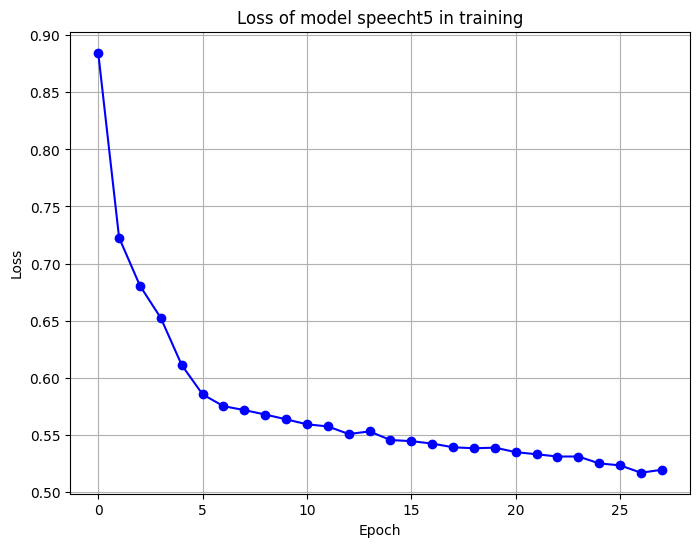

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(losses, marker='o', color='blue', linestyle='-')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss of model speecht5 in training')
plt.grid(True)
plt.show()